# **Explainability Methods for Machine Learning Models**


**Group 9**
* Bayon, Jiannah Alyssa V.
* Fabro, Kate Alexandra R.
* Go, Michael Anthony Gabriel L.
* Seagan, Joshua Miguel V.


## **1.0 Preliminaries**

Load Libraries

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import statistics
import warnings
warnings.filterwarnings('ignore')

Loading Telco Churn Dataset

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("blastchar/telco-customer-churn")

print("Path to dataset files:", path)

100%|██████████| 172k/172k [00:00<00:00, 47.5MB/s]

Extracting files...
Path to dataset files: /root/.cache/kagglehub/datasets/blastchar/telco-customer-churn/versions/1


In [ ]:
import pandas as pd

# Specify the file path and load the CSV
file_path = f"{path}/WA_Fn-UseC_-Telco-Customer-Churn.csv"
data = pd.read_csv(file_path)
df = data

# Display the DataFrame
df.head(20)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
5,9305-CDSKC,Female,0,No,No,8,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,Yes
6,1452-KIOVK,Male,0,No,Yes,22,Yes,Yes,Fiber optic,No,...,No,No,Yes,No,Month-to-month,Yes,Credit card (automatic),89.10,1949.4,No
7,6713-OKOMC,Female,0,No,No,10,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,No,Mailed check,29.75,301.9,No
8,7892-POOKP,Female,0,Yes,No,28,Yes,Yes,Fiber optic,No,...,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes
9,6388-TABGU,Male,0,No,Yes,62,Yes,No,DSL,Yes,...,No,No,No,No,One year,No,Bank transfer (automatic),56.15,3487.95,No


# **2.0 Exploratory Data Analysis**

Distribution of the target variable

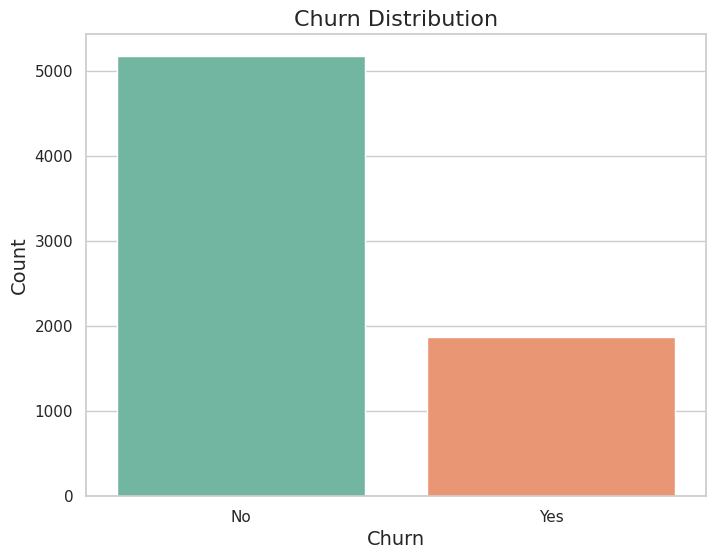

In [ ]:
# Set the aesthetics for the plots
sns.set(style="whitegrid")

# Create a count plot for the Churn column
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='Churn', palette='Set2')

# Add titles and labels
plt.title('Churn Distribution', fontsize=16)
plt.xlabel('Churn', fontsize=14)
plt.ylabel('Count', fontsize=14)

# Show the plot
plt.show()


**Analysis**: There are more non-churn than churned customers, suggesting an imbalance in the dataset

## Missing Values

Checking for any missing values

In [ ]:
df.isna().sum()

,0
customerID,0
gender,0
SeniorCitizen,0
Partner,0
Dependents,0
tenure,0
PhoneService,0
MultipleLines,0
InternetService,0
OnlineSecurity,0


**Analysis**: Upon checking for null values, there appears to be no missing data

In [ ]:
def grab_col_names(dataframe, cat_th=10, car_th=20):

    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == 'O']

    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and
                   dataframe[col].dtypes != 'O']

    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and
                   dataframe[col].dtypes == 'O']

    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in dataframe.columns if col not in cat_but_car]

    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != 'O']
    num_cols = [col for col in dataframe.columns if col not in num_but_cat]

    print(f'Observations: {dataframe.shape[0]}')
    print(f'Variables: {dataframe.shape[1]}')
    print(f'Categorical columns: {len(cat_cols)}')
    print(f'Numeric columns: {len(num_cols)}')
    print(f'Num_but_cat columns: {len(num_but_cat)}')
    print(f'Cat_but_car columns: {len(cat_but_car)}')

    return cat_cols, num_cols, cat_but_car


cat_cols, num_cols, cat_but_car = grab_col_names(df)

Observations: 7043
Variables: 21
Categorical columns: 19
Numeric columns: 20
Num_but_cat columns: 1
Cat_but_car columns: 2


**Analysis**: The dataset has 7,043 observations and 41 variables, including 41 categorical columns, of which 38 are low-unique-value numerics.With only three true numeric columns and no high-cardinality features.

Customer ID columns is unique for all customers. It means it has no information about the customer. We can remove this column.

In [ ]:
df = df.drop('customerID', axis = 1)

Final list of Columns

In [ ]:
df.columns

Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure',
       'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod',
       'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')

Ensuring that 'TotalCharges' is numeric

In [ ]:
df['TotalCharges'] = df['TotalCharges'].replace(' ', np.nan)


In [ ]:
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'])

In [ ]:
df['TotalCharges'] = df['TotalCharges'].fillna(df['TotalCharges'].median())
df['TotalCharges'].dtype

dtype('float64')

Checks for columns that are suitable for one-hot encoding (with 3 to 10 unique values) and those deemed useless (binary columns where any value occurs in less than 1% of the data)

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
def encoding_columns(dataframe):



  ohe_cols = [col for col in dataframe.columns if 10 >= dataframe[col].nunique() > 2]


  useless_cols = []
  for col in dataframe.columns:
      if dataframe[col].nunique() == 2:
          value_counts = dataframe[col].value_counts() / len(dataframe)
          if (value_counts < 0.01).any():
              useless_cols.append(col)

  print(ohe_cols)
  print(useless_cols)
  return ohe_cols, useless_cols


ohe_cols, useless_cols = encoding_columns(df)

['MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract', 'PaymentMethod']
[]


They are the columns we must do one hot encoding. Means there is no useless columns to remove.

In [ ]:
le_cols = [col for col in cat_cols if col not in ohe_cols and
           col not in useless_cols]

In [ ]:
df = pd.get_dummies(df, columns = ohe_cols)

In [ ]:
for col in le_cols:
  df[col] = le.fit_transform(df[col])

In [ ]:
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,...,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,0,1,0,1,0,1,142,29.85,0,...,True,False,False,True,False,False,False,False,True,False
1,1,0,0,0,34,1,0,498,1889.50,0,...,True,False,False,False,True,False,False,False,False,True
2,1,0,0,0,2,1,1,436,108.15,1,...,True,False,False,True,False,False,False,False,False,True
3,1,0,0,0,45,0,0,266,1840.75,0,...,True,False,False,False,True,False,True,False,False,False
4,0,0,0,0,2,1,1,729,151.65,1,...,True,False,False,True,False,False,False,False,True,False


Categorical data have been converted to numeric in order to be able to apply RandomForest

# Scaling

Using StandardScaler to standardize the features in the dataset, while preserving original column names and re-adding the target variable

In [ ]:
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
will_add = df['Churn']
scaling_df = df.drop('Churn', axis = 1)
original_cols = scaling_df.columns
scaled_df = ss.fit_transform(scaling_df)
df = pd.DataFrame(scaled_df, columns = original_cols)
df['Churn'] = will_add

In [ ]:
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,MultipleLines_No,...,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,Churn
0,-1.009559,-0.439916,1.034530,-0.654012,-1.277445,-3.054010,0.829798,-1.131766,-0.994242,-0.963330,...,-0.525927,-0.79607,0.904184,-0.514249,-0.562975,-0.529885,-0.525047,1.406418,-0.544807,0
1,0.990532,-0.439916,-0.966622,-0.654012,0.066327,0.327438,-1.205113,-0.387740,-0.173244,1.038066,...,-0.525927,-0.79607,-1.105970,1.944582,-0.562975,-0.529885,-0.525047,-0.711026,1.835513,0
2,0.990532,-0.439916,-0.966622,-0.654012,-1.236724,0.327438,0.829798,-0.517317,-0.959674,1.038066,...,-0.525927,-0.79607,0.904184,-0.514249,-0.562975,-0.529885,-0.525047,-0.711026,1.835513,1
3,0.990532,-0.439916,-0.966622,-0.654012,0.514251,-3.054010,-1.205113,-0.872611,-0.194766,-0.963330,...,-0.525927,-0.79607,-1.105970,1.944582,-0.562975,1.887201,-0.525047,-0.711026,-0.544807,0
4,-1.009559,-0.439916,-0.966622,-0.654012,-1.236724,0.327438,0.829798,0.095041,-0.940470,1.038066,...,-0.525927,-0.79607,0.904184,-0.514249,-0.562975,-0.529885,-0.525047,1.406418,-0.544807,1


# **3.0 Random Forest Classifier**

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.metrics import classification_report

Separates the dataset to the target variable from the features, and then splits the dataset into training and testing sets, allocating 80% of the data for training and 20% for testing, while ensuring reproducibility with a fixed random state of 42.

In [ ]:
y = df['Churn']
x = df.drop('Churn', axis = 1)

X_train, X_test, y_train, y_test = train_test_split(x, y, random_state = 42, train_size = 0.8)

 Initializing a random forest regression model with a maximum depth of 6, a random state of 0, and 10 estimators, and then fits the model to the training data (X_train and y_train).

In [ ]:
# Build the model with Random Forest Regressor :
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(max_depth=6, random_state=0, n_estimators=10)
model.fit(X_train, y_train)

RandomForestClassifier(max_depth=6, n_estimators=10, random_state=0)

Use the trained random forest regression model to make predictions on the test dataset

In [ ]:
y_pred = model.predict(X_test)

In [ ]:
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, y_pred)**(0.5)
mse

0.44098090545736623

**Analysis**: An RMSE of approximately 0.3627 indicates that the model's predictions for customer churn deviate from actual values by an average of about 0.36 units, suggesting reasonable accuracy in estimating whether customers will churn,

In [ ]:
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_test)
print(classification_report(y_test, rf_pred))

              precision    recall  f1-score   support

           0       0.83      0.91      0.87      1036
           1       0.65      0.49      0.56       373

    accuracy                           0.80      1409
   macro avg       0.74      0.70      0.71      1409
weighted avg       0.78      0.80      0.79      1409



**Analysis**:
* The model shows strong performance for non-churned customers (class 0) with a precision of 0.83, recall of 0.91, and F1-score of 0.87
* It struggles with churned customers (class 1), achieving a precision of 0.66, recall of 0.49, and F1-score of 0.56
* Overall accuracy is 80%, with macro averages of 0.74 (precision), 0.70 (recall), and 0.72 (F1-score), and weighted averages of 0.79, 0.80, and 0.79, means there is a need for improvement in predicting churned customers to enhance retention strategies.
* These results may reflect the imbalanced nature of the dataset, where the number of non-churned customers significantly exceeds that of churned customers, leading the model to be more effective at predicting the majority class, thus indicating a need for improved strategies to identify and retain at-risk customers.







#**4.0 Interpret Model with SHAP (SHapley Additive exPlanations)**

**SHAP (SHapley Additive exPlanations)** is a method that uses game theory to explain the output of any machine learning model. It provides both global and local interpretability by assigning an importance value to each feature for a particular prediction.


In [ ]:
!pip install shap
import shap

In [ ]:
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_test, approximate=False, check_additivity=False)

In [ ]:
X_test.shape

(1409, 40)

In [ ]:
shap_values.shape

(1409, 40, 2)

In [ ]:
class_shap_values = shap_values[:, :, 1]

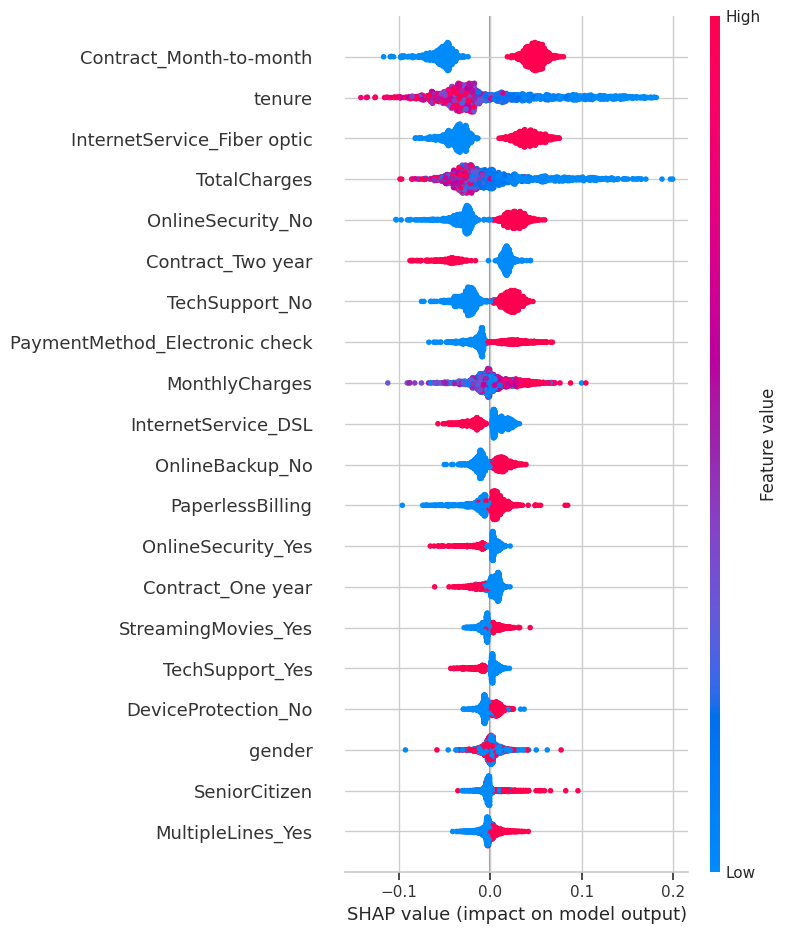

In [ ]:
samples = X_test
shap.summary_plot(class_shap_values, samples)

**Analysis**

The summary plot above shows the most important features (descending) for the random forest classification tasks, with the most important features in determining observation classifications being having monthly contracts, tenure, ownership of fiber optic internet services, total charges, and the absence of online security. Additionally, along the horizontal axis, we specify a shap value for each of the predictions wherein positive and negative shap values implement predictions to one class or the other, with positive values implementing predictions toward observations being churned. The farther their values are from 0.0, may it be negative or positive, means that the feature contributed strongly for that specific observation prediction.

Lastly, the colors show the direction through which the features impact the predictions-- for instance, high feature values (red) for having monthly contracts or ownership of fiber optic internet services would mean that it pushes its predictions toward churning. On the other hand, higher shap values for total charges or tenure pushes predictions towards non-churning, as shown by high shap values (red) in the negative part of the scale.

In [ ]:
def make_shap_waterfall_plot(shap_values, features, num_display=20):
  column_list = features.columns
  feature_ratio = (np.abs(shap_values).sum(0) / np.abs(shap_values).sum()) * 100
  column_list = column_list[np.argsort(feature_ratio)[::-1]]
  feature_ratio_order = np.sort(feature_ratio)[::-1]
  cum_sum = np.cumsum(feature_ratio_order)
  column_list = column_list[:num_display]
  feature_ratio_order = feature_ratio_order[:num_display]
  cum_sum = cum_sum[:num_display]

  num_height = 0
  if (num_display >= 20) & (len(column_list) >= 20):
    num_height = (len(column_list) - 20) * 0.4

  fig, ax1 = plt.subplots(figsize=(8, 8 + num_height))
  ax1.plot(cum_sum[::-1], column_list[::-1], c='blue', marker='o')
  ax2 = ax1.twiny()
  ax2.barh(column_list[::-1], feature_ratio_order[::-1], alpha=0.6)

  ax1.grid(True)
  ax2.grid(False)
  ax1.set_xticks(np.arange(0, round(cum_sum.max(), -1)+1, 10))
  ax2.set_xticks(np.arange(0, round(feature_ratio_order.max(), -1)+1, 10))
  ax1.set_xlabel('Cumulative Ratio')
  ax2.set_xlabel('Composition Ratio')
  ax1.tick_params(axis="y", labelsize=13)
  plt.ylim(-1, len(column_list))

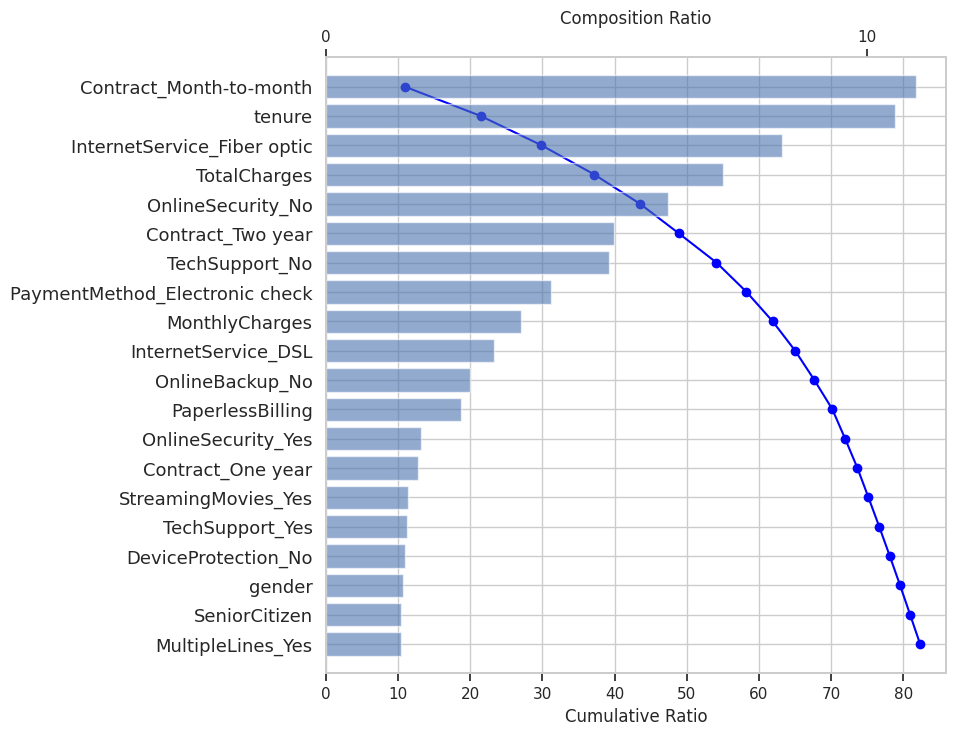

In [ ]:
make_shap_waterfall_plot(class_shap_values, samples)


The waterfall plot above shows the breakdown of contributions of said features from largest to smallest. The line shows the cumulative contribution as more and more features contribute to the classification task.

In [ ]:
i = 0
shap_values_for_instance = shap_values[i, :, 1]
features_for_instance = X_test.iloc[i, :]
expected_value = explainer.expected_value[1]
shap.initjs()
shap.force_plot(expected_value, shap_values_for_instance, features_for_instance)

The force plot above, meawhile, shows how the features similarly contribute to probability predictions for being churned-- features like decreasing total charges and tenure increase the probability of being churned (having negative values), while increasing ownership of DSL internet services decrease such probability of being churned.

# **5.0 Interpret model predictions with LIME**



**Local Interpretable Model-agnostic Explanations (LIME)** focuses on training local surrogate models to explain individual predictions. Local surrogate models are interpretable models that are used to explain individual predictions of black box machine learning models. Surrogate models are trained to approximate the predictions of the underlying black box model. Instead of training a global surrogate model, LIME focuses on training local surrogate models.


In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=35cce85f8a64efd76cff246960ec78c2fc55b6f775f299524bbdff2e92454bf2
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
import lime
import lime.lime_tabular

Uses LIME (Local Interpretable Model-agnostic Explanations) by specifying the training data (X_train), feature names, class names for the output, verbosity level, and the mode of prediction as regression.








In [ ]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns.values.tolist(),
                                                  class_names=['MEDV'], verbose=True, mode='regression')

Then I use the explainer to explain the predictions - variation of 5 instances and to explain the predictions.


I. Select 5th instance (fifth row)


In [ ]:
# Choose the 5th instance and use it to predict the results
j = 5
exp = explainer.explain_instance(X_test.values[j], model.predict, num_features=6)


Intercept -0.03354767549045658
Prediction_local [0.10148225]
Right: 0


In [ ]:
# Show the predictions
exp.show_in_notebook(show_table=True)


In [ ]:
exp.as_list()

[('-0.99 < OnlineSecurity_No <= 1.01', 0.08974896835797017),
 ('TotalCharges > 0.67', -0.0871938526079846),
 ('-0.89 < InternetService_Fiber optic <= 1.13', 0.08178326531291351),
 ('InternetService_DSL <= -0.72', 0.0639070783006761),
 ('tenure > 0.92', -0.06291651193818236),
 ('-0.99 < TechSupport_No <= 1.01', 0.049700980907158646)]

**Analysis**:

During the 5th instance:

**OnlineSecurity_No**: -0.99 < OnlineSecurity_No <= 1.01 contributes positively (0.0897) to the prediction. This suggests that customers without online security services are slightly more likely to be predicted in the positive outcome class (e.g., churn, if predicting customer churn).

**TotalCharges**: TotalCharges > 0.67 has a negative impact (-0.0872). Higher total charges reduce the likelihood of the positive outcome class. This implies that higher charges might correlate with loyalty or lower churn likelihood.

**InternetService_Fiber optic**: -0.89 < InternetService_Fiber optic <= 1.13 contributes positively (0.0818), indicating that having fiber optic internet service slightly increases the likelihood of the positive class (e.g., churn). This could reflect customer dissatisfaction with this service type.

**InternetService_DSL**: InternetService_DSL <= -0.72 contributes positively (0.0639), suggesting that customers who do not have DSL service are more likely to belong to the positive outcome class (such as churn).

**tenure**: tenure > 0.92 has a negative contribution (-0.0629). A longer tenure correlates with a lower likelihood of the positive outcome (e.g., churn), indicating that customers who have stayed longer tend to stay with the service.

**TechSupport_No**: -0.99 < TechSupport_No <= 1.01 adds a small positive weight (0.0497). Not having tech support slightly increases the likelihood of the positive outcome class.

II. Select 10th instance (tenth row)

In [ ]:
# Choose the 10th instance and use it to predict the results
j = 10
exp = explainer.explain_instance(X_test.values[j], model.predict, num_features=6)

Intercept 0.06848873048210188
Prediction_local [0.17712437]
Right: 0


In [ ]:
# Show the predictions
exp.show_in_notebook(show_table=True)

In [ ]:
exp.as_list()

[('TotalCharges <= -0.83', 0.13845469213550995),
 ('tenure <= -0.95', 0.12636636387119823),
 ('InternetService_Fiber optic <= -0.89', -0.09083390244047354),
 ('OnlineSecurity_No <= -0.99', -0.09052950359997174),
 ('InternetService_DSL <= -0.72', 0.07140090409699298),
 ('InternetService_No > -0.53', -0.04622291172597029)]

**Analysis**:

During the 10th instance:

**TotalCharges**: TotalCharges <= -0.83 has a positive contribution (0.1385). This suggests that lower total charges (below this threshold) increase the likelihood of the positive outcome (churn). It could indicate that customers with lower charges are more likely to leave, possibly because they are new customers or less invested.

**tenure**: tenure <= -0.95 also has a positive impact (0.1264). Shorter tenure strongly contributes to the likelihood of the positive outcome, indicating that customers who haven't been with the company long are more likely to fall into the positive class (churn).

**InternetService_Fiber optic**: InternetService_Fiber optic <= -0.89 contributes negatively (-0.0908). This implies that not having fiber optic internet service decreases the likelihood of the positive class (churn), suggesting that customers without fiber optic may be more satisfied.

**OnlineSecurity_No**: OnlineSecurity_No <= -0.99 also has a negative effect (-0.0905). Customers who do not lack online security are less likely to be in the positive class, indicating that having online security correlates with staying with the service.

**InternetService_DSL**: InternetService_DSL <= -0.72 has a positive contribution (0.0714). Not having DSL service slightly increases the probability of the positive outcome (churn). This could imply that customers who don’t use DSL are more likely to leave, possibly because they prefer fiber optic or other options.

**InternetService_No**: InternetService_No > -0.53 contributes negatively (-0.0462), indicating that not using any internet service (or not falling into the "No Internet" category) slightly reduces the likelihood of the positive outcome. This could imply that having any internet service (DSL or fiber optic) slightly discourages churn.

III. Select 15th instance

In [ ]:
# Choose the 15th instance and use it to predict the results
j = 15
exp = explainer.explain_instance(X_test.values[j], model.predict, num_features=6)

Intercept -0.1279568462123658
Prediction_local [0.27500619]
Right: 1


In [ ]:
# Show the predictions
exp.show_in_notebook(show_table=True)

In [ ]:
exp.as_list()


[('-0.89 < InternetService_Fiber optic <= 1.13', 0.0979864409324928),
 ('-0.99 < OnlineSecurity_No <= 1.01', 0.0908602646787422),
 ('InternetService_DSL <= -0.72', 0.07874217433320499),
 ('InternetService_No <= -0.53', 0.04689363492114943),
 ('MonthlyCharges > 0.85', 0.04665359390298591),
 ('-0.85 < MultipleLines_Yes <= 1.17', 0.04182692837213359)]

**Analysis**:

During the 15th instance:

**InternetService_Fiber optic**: -0.89 < InternetService_Fiber optic <= 1.13 has a positive contribution (0.098). Possibly indicating customer dissatisfaction with this service type.

**OnlineSecurity_No**: -0.99 < OnlineSecurity_No <= 1.01 also has a positive effect (0.091). Not having online security services is associated with a higher probability of the churning. This might imply that customers without this security service feel less supported or secure.

**InternetService_DSL**: InternetService_DSL <= -0.72 contributes positively (0.079), potentially because customers who don’t have DSL might be using fiber optic or no service at all, which are associated with churn in this dataset.

**InternetService_No**: InternetService_No <= -0.53 has a positive impact (0.047). This condition indicates that not falling into the "No Internet" category slightly increases the probability of the churn outcome. This might mean that having an internet service (fiber optic or DSL) relates to a higher churn likelihood.

**MonthlyCharges**: MonthlyCharges > 0.85 also has a positive contribution (0.047). Higher monthly charges slightly increase the likelihood of the positive outcome, which might reflect customers’ sensitivity to higher costs, contributing to churn.

**MultipleLines_Yes**: -0.85 < MultipleLines_Yes <= 1.17 contributes positively (0.042). This indicates that customers with multiple lines are slightly more likely to belong to the positive outcome class, which may suggest they are more likely to leave due to the extra expense or complexity.ave different service expectations or needs compared to other demographics.

IV. Select 20th instance (twenthieth row)



In [ ]:
# Choose the 20th instance and use it to predict the results
j = 20
exp = explainer.explain_instance(X_test.values[j], model.predict, num_features=6)

Intercept -0.15569186848029348
Prediction_local [0.38141873]
Right: 1


In [ ]:
# Show the predictions
exp.show_in_notebook(show_table=True)

In [ ]:
exp.as_list()

[('tenure <= -0.95', 0.12124823643819067),
 ('TotalCharges <= -0.83', 0.12119655770110004),
 ('-0.89 < InternetService_Fiber optic <= 1.13', 0.09045643058628194),
 ('-0.99 < OnlineSecurity_No <= 1.01', 0.08631447512482335),
 ('InternetService_DSL <= -0.72', 0.06801573078292991),
 ('OnlineSecurity_No internet service <= -0.53', 0.04987917148713285)]

**Analysis**:

During the 20th instance:

**tenure**: tenure <= -0.95 has the strongest positive contribution (0.1212) to churn. This means that shorter tenure (newer customers) increases the likelihood of churn, suggesting that customers who have not been with the company for long are more likely to leave.

**TotalCharges**: TotalCharges <= -0.83 also has a strong positive impact (0.1212) on churn. Lower total charges are associated with a higher likelihood of churn, which could imply that customers with fewer accumulated charges (perhaps due to shorter service duration) are more prone to leave.

**InternetService_Fiber optic**: -0.89 < InternetService_Fiber optic <= 1.13 contributes positively (0.0905) to churn. This suggests that customers with fiber optic internet service are slightly more likely to churn, potentially reflecting dissatisfaction with this type of internet service.

**OnlineSecurity_No**: -0.99 < OnlineSecurity_No <= 1.01 also has a positive contribution (0.0863) to churn. Customers without online security services are more likely to churn, possibly indicating that the lack of online security is a concern or lowers perceived service value.

**InternetService_DSL**: InternetService_DSL <= -0.72 has a positive impact (0.068) on churn. Customers who do not have DSL service (likely using fiber optic or no internet service) are more likely to churn, which could reflect dissatisfaction with available service options.

V. Select 25th instance

In [ ]:
# Choose the 25th instance and use it to predict the results
j = 25
exp = explainer.explain_instance(X_test.values[j], model.predict, num_features=6)

Intercept 0.02297510067922516
Prediction_local [0.25181906]
Right: 0


In [ ]:
# Show the predictions
exp.show_in_notebook(show_table=True)

In [ ]:
exp.as_list()

[('tenure <= -0.95', 0.13549439279715095),
 ('TotalCharges <= -0.83', 0.13544251742486055),
 ('InternetService_Fiber optic <= -0.89', -0.08756000684996078),
 ('-0.99 < OnlineSecurity_No <= 1.01', 0.08596600204089627),
 ('-0.72 < InternetService_DSL <= 1.38', -0.07977297330734909),
 ('-0.85 < MultipleLines_Yes <= 1.17', 0.03927402412331984)]

**Analysis**:

During the 25th instance:

**tenure**: tenure <= -0.95 has the strongest positive contribution (0.1355) to churn. This suggests that shorter tenure (newer customers) is strongly associated with a higher likelihood of churn, indicating that customers who haven’t been with the company long are more prone to leaving.

**TotalCharges**: TotalCharges <= -0.83 also has a strong positive effect (0.1354) on churn. Lower total charges are linked to a higher probability of churn, possibly indicating that customers with lower total payments (likely newer customers) are at greater risk of leaving.

**InternetService_Fiber optic**: InternetService_Fiber optic <= -0.89 has a negative contribution (-0.0876) to churn. This suggests that customers who do not have fiber optic service are less likely to churn, potentially indicating higher satisfaction or fewer issues with other types of internet service.

**OnlineSecurity_No**: -0.99 < OnlineSecurity_No <= 1.01 has a positive impact (0.086) on churn. Customers without online security services are more likely to churn, which may indicate that the absence of security services reduces the perceived value of the offering.

**InternetService_DSL**: -0.72 < InternetService_DSL <= 1.38 has a negative contribution (-0.0798) to churn. This implies that having DSL service slightly reduces the likelihood of churn, suggesting that DSL users might be more content with their service compared to fiber optic users.

**Are there any unexpected feature importance?**

Notably, **InternetService_Fiber** optic often has a positive influence on churn, suggesting fiber optic users are more likely to churn despite the service typically being viewed as premium. This could imply issues such as dissatisfaction with fiber optic’s service quality, high costs, or regional availability problems.

Similarly, **TotalCharges** consistently shows that lower total charges increase the likelihood of churn, which is somewhat unexpected, as high charges are often assumed to drive churn. This trend likely reflects newer customers who haven’t yet accumulated substantial charges and may indicate their vulnerability to early churn due to lower commitment or satisfaction.

Another key feature, **tenure**, also plays a significant role, with shorter tenure strongly associated with a higher churn probability. This finding, though somewhat expected, underscores the critical need to engage new customers quickly to foster loyalty.

Finally, **MultipleLines_Yes** appears positively correlated with churn across instances, suggesting that having multiple lines may introduce complexity or cost that increases churn risk. Overall, these patterns highlight the importance of addressing potential dissatisfaction among fiber optic and new customers while also exploring why multiple-line accounts may contribute to churn.




# **6.0 Interpret model with PDP (Partial Dependence Plot)**

**Partial dependence plots (PDP)** and individual conditional expectation (ICE) plots can be used to visualize and analyze interaction between the target response and a set of input features of interest.






In [ ]:
from sklearn.datasets import make_hastie_10_2
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay
import matplotlib.pyplot as plt
import pandas as pd

In [ ]:
feature_importances = rf.feature_importances_
importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

print(importance_df)

                                    Feature  Importance
8                              TotalCharges    0.172738
4                                    tenure    0.149964
7                            MonthlyCharges    0.146787
33                  Contract_Month-to-month    0.045281
15                        OnlineSecurity_No    0.030857
24                           TechSupport_No    0.028369
0                                    gender    0.028200
13              InternetService_Fiber optic    0.026319
6                          PaperlessBilling    0.025679
38           PaymentMethod_Electronic check    0.024509
2                                   Partner    0.023662
1                             SeniorCitizen    0.020711
3                                Dependents    0.019375
18                          OnlineBackup_No    0.018000
35                        Contract_Two year    0.017759
21                      DeviceProtection_No    0.016405
9                          MultipleLines_No    0

We will choose the top 5 important features that has an impact on the model for the PDP.

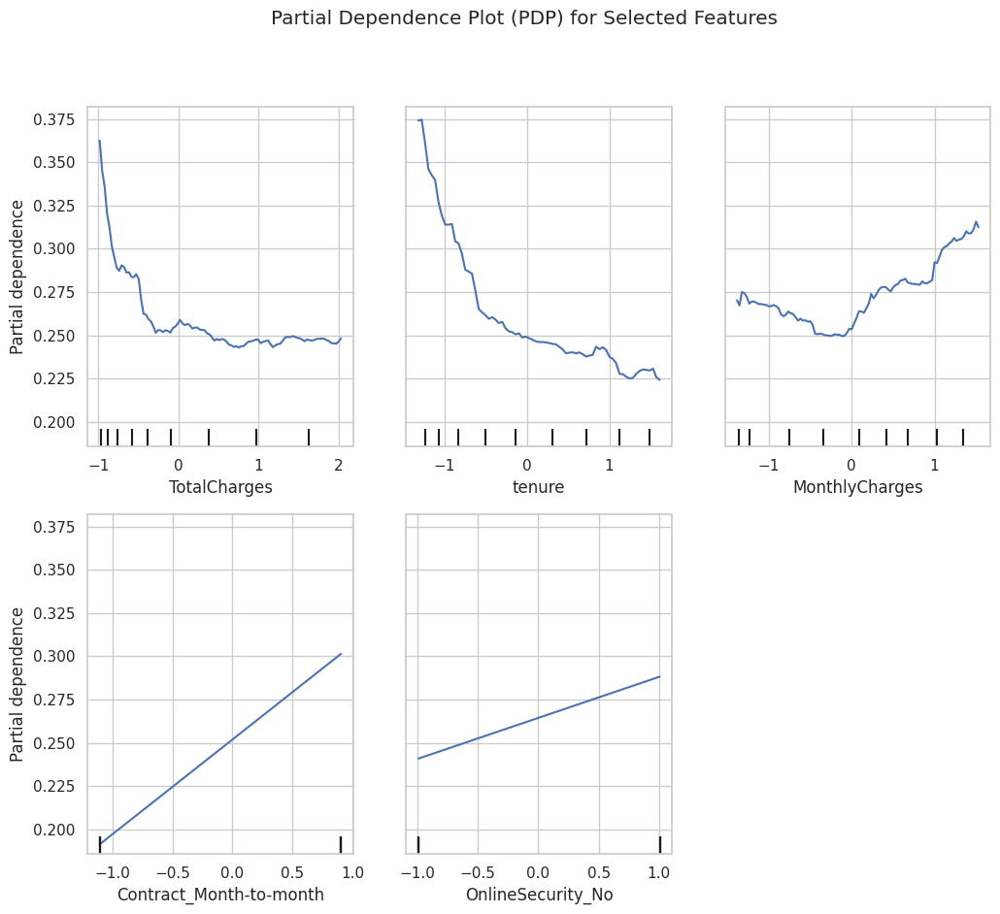

In [ ]:
features_to_plot = ['TotalCharges','tenure','MonthlyCharges','Contract_Month-to-month','OnlineSecurity_No']

# Create and plot Partial Dependence Plot
fig, ax = plt.subplots(figsize=(12, 10))
PartialDependenceDisplay.from_estimator(rf, X_train, features_to_plot, ax=ax)
plt.suptitle("Partial Dependence Plot (PDP) for Selected Features")
plt.show()



*   **Total Charge** - there is a decreasing trend initially with the partial dependence score dropping as Total Charge increases. This suggest that customers with lower total charge is most likely to churn that those with higher total charge.
*   **Tenure** - it has a downward trend indicating customers with longer tenure have a lower chance of chruning. As the partial dependence score increases tenure decreases.
*  **Monthly Charge** - the PDP is in a U shape, where the probability of churning decreases with increasing monthly charges at the start, but it starts to increase at the later half. This suggest that customers with either low or high monthly charge are more likely to churn but for those that has moderate level of monthly charge are less likely to.
*   **Contract Month to Month** - has an steep upward trend, indicating that customers on a month to month contract are more likely to churn than those with longer (yearly) contracts. This makes sense as a month-to-month contract is flexible making it easy for customers to leave. While longer contracts would tend to leave customers less likely to churn due to the long committment and any penalties that would occur from ending it early or terminating it.
* **Online Security No** - The slight upward trend in probability to churn  for customers who do not have online security indicates that no online security might correlate with a higher risk of churn. This could suggest that customers without certain value-added services, such as online security, may be less engaged or see fewer reasons to stay with the provider.

In conclusion, these are consistent with common knowledge about the industry. Customers who use the service for more months or times and have higher total charges in their credit limit, customers are less likely to churn.
Negotiated agreements and absence of some optional services like internet security are closely connected with churn probability.
Also, because the probability of churn is positively related to the reciprocal of the monthly charges paid, customers with either extremely high or extremely low monthly charges may be also more likely to churn.





# **Conclusion**

This project provided an in-depth examination of machine learning explainability methods applied to a Random Forest model for predicting customer churn using the Telco Churn dataset. By implementing SHAP, LIME, and PDP, we were able to identify the most influential features affecting model predictions and derive valuable insights into customer behaviors. The analysis revealed that factors such as customer tenure, monthly charges, and contract type were primary indicators of churn risk. Specifically, longer tenure was associated with increased loyalty, while flexible, month-to-month contracts and a lack of online security were linked to a higher likelihood of customer churn. The Random Forest model exhibited strong performance for non-churned customers but showed challenges with precision and recall for churned customers, indicating the impact of dataset imbalance on predictive accuracy.

Each explainability method brought unique strengths and trade-offs to the analysis. SHAP provided comprehensive and consistent insights into feature contributions, making it ideal for detailed, unbiased interpretations. However, it was computationally intensive, limiting its feasibility for real-time applications. LIME, on the other hand, offered quick and model-agnostic local explanations, allowing for easy interpretation of individual predictions, but its consistency varied with different data points. PDP was beneficial for visualizing general feature trends and understanding average effects on model outputs but fell short when it came to capturing feature interactions and assumed feature independence, which could be a limitation in correlated data. These insights emphasize the importance of choosing the right explainability method based on project requirements, balancing between depth of analysis, computational resources, and the type of insights needed. Overall, integrating explainable AI fosters trust and enhances data-driven strategies, particularly in fields like customer retention, where transparency and actionable insights are essential.


**Sources**
* SHAP: https://github.com/aig3rim/Interpret_random_forest_classifier_using_SHAP/blob/master/Random_forest_classifier_SHAP.ipynb
* LIME: https://www.kaggle.com/code/prashant111/explain-your-model-predictions-with-lime#3.9-Evaluate-Performance-
* PDP: https://scikit-learn.org/stable/modules/partial_dependence.html
